In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
from dateutil import parser
import seaborn as sns
from scipy.stats import norm
from scipy.stats import genextreme as gev
from scipy.stats import pareto 
from scipy import stats
import geopandas as gpd
from shapely.geometry import Point, Polygon
from shapely import wkt
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import random
import censusdata

# Temporal Analysis on Boston Census Block Group Diversity Index

### Step 1: Import Supporting Shape Files

    1. Boston Block Group 2020 shapefile
    2. Boston Block Group 2010 shapefile (due to redistricting)


In [2]:
#import boston block groups 2020

blockgroup20_BOS = gpd.read_file('../Data/Census2020_BlockGroups/Census2020_BlockGroups.shp')
#exclude Harbor Islands
blockgroup20_BOS = blockgroup20_BOS[blockgroup20_BOS['GEOID20'] != '250259801011']
blockgroup20_BOS = blockgroup20_BOS.to_crs('epsg:4326')
blockgroup20_BOS.head()

,OBJECTID,STATEFP20,COUNTYFP20,TRACTCE20,BLKGRPCE20,GEOID20,NAMELSAD20,MTFCC20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,Shape_STAr,Shape_STLe,geometry
0,1,25,025,040600,1,250250406001,Block Group 1,G5030,S,1265377.0,413598.0,+42.3833695,-071.0707743,1.807118e+07,29256.866068,"POLYGON ((-71.08097 42.38232, -71.08095 42.382..."
1,2,25,025,051101,1,250250511011,Block Group 1,G5030,S,220626.0,0.0,+42.3882285,-071.0046816,2.374654e+06,9142.174252,"POLYGON ((-71.01084 42.38613, -71.00891 42.386..."
2,3,25,025,051101,4,250250511014,Block Group 4,G5030,S,227071.0,270.0,+42.3913407,-071.0020343,2.446949e+06,11579.546171,"POLYGON ((-71.00629 42.39098, -71.00628 42.391..."
3,4,25,025,981600,1,250259816001,Block Group 1,G5030,S,586981.0,158777.0,+42.3886205,-070.9934424,8.026752e+06,16626.718823,"POLYGON ((-71.00113 42.38710, -71.00100 42.387..."
4,5,25,025,010204,3,250250102043,Block Group 3,G5030,S,145888.0,0.0,+42.3459611,-071.1020344,1.570220e+06,5510.560013,"POLYGON ((-71.10507 42.34670, -71.10457 42.346..."


In [3]:
#import boston block groups 2010

blockgroup10_BOS = gpd.read_file('../Data/CBG_Boston_2010_BARI/Census Block Groups.shp')
blockgroup10_BOS['TRACT'] = blockgroup10_BOS['GEOID10'].astype(str).str[5:-1]
blockgroup10_BOS['BLKGRP'] = 'Block Group '+blockgroup10_BOS['GEOID10'].astype(str).str[-1]
blockgroup10_BOS.head()

,OBJECTID,GEOID10,ALAND10,AWATER10,POP100,HU100,Type,Res,BG_ID_10,CT_ID_10,...,WARD,ISD_Nbhd,Police_Dis,Fire_Distr,PWD,Shape_Leng,Shape_Area,geometry,TRACT,BLKGRP
0,1,250250101031,101211.0,0.0,2111.0,309.0,I,0.0,250250101031,25025010103,...,21.0,Fenway/Kenmore,4.0,4.0,1-10A: Kenmore/Fenway/Mission Hill,0.020754,0.000011,"POLYGON ((-71.10520 42.34844, -71.10682 42.348...",010103,Block Group 1
1,2,250250104053,39125.0,0.0,626.0,355.0,I,0.0,250250104053,25025010405,...,4.0,Fenway/Kenmore,4.0,4.0,1-10A: Kenmore/Fenway/Mission Hill,0.008288,0.000004,"POLYGON ((-71.08350 42.34126, -71.08431 42.340...",010405,Block Group 3
2,3,250250102033,67710.0,0.0,1563.0,1078.0,I,0.0,250250102033,25025010203,...,5.0,Fenway/Kenmore,4.0,4.0,1-10A: Kenmore/Fenway/Mission Hill,0.012436,0.000007,"POLYGON ((-71.09841 42.34079, -71.09863 42.340...",010203,Block Group 3
3,4,250250102032,115062.0,0.0,2369.0,1526.0,I,0.0,250250102032,25025010203,...,5.0,Fenway/Kenmore,4.0,4.0,1-10A: Kenmore/Fenway/Mission Hill,0.015750,0.000013,"POLYGON ((-71.10252 42.34337, -71.10242 42.343...",010203,Block Group 2
4,5,250250102041,39843.0,0.0,1098.0,287.0,I,0.0,250250102041,25025010204,...,21.0,Fenway/Kenmore,4.0,4.0,1-10A: Kenmore/Fenway/Mission Hill,0.012847,0.000004,"POLYGON ((-71.10520 42.34844, -71.10468 42.348...",010204,Block Group 1


In [4]:
blockgroup10_BOS.columns

Index(['OBJECTID', 'GEOID10', 'ALAND10', 'AWATER10', 'POP100', 'HU100', 'Type',
       'Res', 'BG_ID_10', 'CT_ID_10', 'BOSNA_R_ID', 'NSA_NAME', 'BRA_PD_ID',
       'BRA_PD', 'ZIPCODE', 'City_Counc', 'WARD', 'ISD_Nbhd', 'Police_Dis',
       'Fire_Distr', 'PWD', 'Shape_Leng', 'Shape_Area', 'geometry', 'TRACT',
       'BLKGRP'],
      dtype='object')

### Step 2: Find Relevant Race Data Sets and Geography Codes for Bos

In [5]:
#get census column names we want to pull using the census api
census_columns = []

for i in range(1,13):
    if i == 2 or i == 10 or i == 11:
        pass
    elif i <10:
        census_columns.append('B03002_00{}E'.format(i))
    else:
        census_columns.append('B03002_0{}E'.format(i))

print(census_columns)

#column categorical values
column_vals = ['Total', 'White, not hispanic', 'Black or African American, not hispanic',\
               'American Indian and Alaska Native, not hispanic', 'Asain, not hispanic',\
               'Native Hawaiian and Other Pacific Islander, not hispanic', 'Some other race alone, not hispanic',\
               'Two or More Races, not hispanic', 'Hispanic or Latino']

#create dictionary to rename table columns later on
col_dict = {census_columns[i]: column_vals[i] for i in range(len(column_vals))}
print(col_dict)

['B03002_001E', 'B03002_003E', 'B03002_004E', 'B03002_005E', 'B03002_006E', 'B03002_007E', 'B03002_008E', 'B03002_009E', 'B03002_012E']
{'B03002_001E': 'Total', 'B03002_003E': 'White, not hispanic', 'B03002_004E': 'Black or African American, not hispanic', 'B03002_005E': 'American Indian and Alaska Native, not hispanic', 'B03002_006E': 'Asain, not hispanic', 'B03002_007E': 'Native Hawaiian and Other Pacific Islander, not hispanic', 'B03002_008E': 'Some other race alone, not hispanic', 'B03002_009E': 'Two or More Races, not hispanic', 'B03002_012E': 'Hispanic or Latino'}


In [6]:
#get state and county ids for both new york and boston
states = censusdata.geographies(censusdata.censusgeo([('state', '*')]), 'acs5', 2020)
print(states['New York'], states['Massachusetts'])

boscounties = censusdata.geographies(censusdata.censusgeo([('state', '25'), ('county', '*')]), 'acs5', 2020)
print(boscounties['Suffolk County, Massachusetts'])


nyccounties = censusdata.geographies(censusdata.censusgeo([('state', '36'), ('county', '*')]), 'acs5', 2020)
print(nyccounties["Kings County, New York"], nyccounties["Bronx County, New York"],\
      nyccounties["Queens County, New York"], nyccounties["Richmond County, New York"], nyccounties["New York County, New York"])

Summary level: 040, state:36 Summary level: 040, state:25
Summary level: 050, state:25> county:025
Summary level: 050, state:36> county:047 Summary level: 050, state:36> county:005 Summary level: 050, state:36> county:081 Summary level: 050, state:36> county:085 Summary level: 050, state:36> county:061


### State and County Metadata from the information provided above:

### New York State ID = 36
        New York County = 061
        Kings County = 047
        Bronx County = 005
        Queens County = 081
        Richmond County = 085
### Massachusetts State ID = 25
        Suffolk County ID = 025

In [7]:
#define function to retrieve census/ACS data given the variables defined above
def get_acs5_data(yr,stateid,countyid,column_ls,column_dict):
    """
    Parameters
    ----------
    yr: int
        The census year of interest
    stateid: str
        State id  of interest in the form of a string
    countyid: str
        County id of interest in the form of a string
    column_ls: list
        The list of ACS column values you are looking to extract
    column_dict: dict
        Dictionary assigning categorical values to associated ACS column
        
        key: ACS column (e.g. B3002_001E)
        value: Categorical value (e.g. 'Total')
        
    Returns
    -------
    df: dataframe
        Dataframe containing population counts of interest at the available
        geographical/spatial resolution (e.g. census blocks, tracts, block groups)
    """
    
    df = censusdata.download('acs5', yr,
               censusdata.censusgeo([('state', stateid),
                                     ('county', countyid),
                                     ('block group', '*')]),
                                      column_ls)
    df.reset_index(inplace=True)
    df['index'] = df['index'].astype('str')
    
    Block_Group = []
    tract = []
    for index, row in df.iterrows():
        Block_Group.append(row['index'][:13])
        tract.append(row['index'][-21:-15])

    df['Block Group'] = Block_Group
    df['Tract'] = tract
    
    df = df.rename(columns = col_dict)
    df = df.rename(columns = {'index':'Geographical Information'})
    
    return df

In [8]:
#iterate through years to see what data we can access and the number of census block groups for each year
acs_yrls = [2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010, 2009]

for yr in acs_yrls:
    try:
        bos_ethnicity = get_acs5_data(yr,'25','025',census_columns,col_dict)
        print(len(bos_ethnicity))
        print('Successfully retreived data from: '+str(yr))
    except:
        print('Unsuccessfully retreived data from: '+str(yr))
        pass

681
Successfully retreived data from: 2020
646
Successfully retreived data from: 2019
646
Successfully retreived data from: 2018
646
Successfully retreived data from: 2017
646
Successfully retreived data from: 2016
646
Successfully retreived data from: 2015
646
Successfully retreived data from: 2014
646
Successfully retreived data from: 2013
Unsuccessfully retreived data from: 2012
Unsuccessfully retreived data from: 2011
Unsuccessfully retreived data from: 2010
631
Successfully retreived data from: 2009


Since there is no acs 5 yr estimates for the years of 2010, 2011, and 2012 we will begin our temporal analysis in 2013 and go through 2020. However, another thing to notice from the length of our output data is that 2020 is 15 units larger than the datasets from 2013-2019. My guess this is due to redistricting and thus we will need to seperate shapefiles. 

# Join ethnicity tbl to shapefiles

In [9]:
bos_ethnicity = get_acs5_data(2020,'25','025',census_columns,col_dict) 
bos_ethnicity.head()

,Geographical Information,Total,"White, not hispanic","Black or African American, not hispanic","American Indian and Alaska Native, not hispanic","Asain, not hispanic","Native Hawaiian and Other Pacific Islander, not hispanic","Some other race alone, not hispanic","Two or More Races, not hispanic",Hispanic or Latino,Block Group,Tract
0,"Block Group 3, Census Tract 1304.02, Suffolk C...",732,491,0,0,46,0,0,12,183,Block Group 3,130402
1,"Block Group 2, Census Tract 1304.04, Suffolk C...",940,752,24,0,99,0,0,9,56,Block Group 2,130404
2,"Block Group 3, Census Tract 1304.06, Suffolk C...",390,214,95,0,0,0,0,0,81,Block Group 3,130406
3,"Block Group 1, Census Tract 1403, Suffolk Coun...",1172,54,422,0,0,0,0,0,696,Block Group 1,140300
4,"Block Group 4, Census Tract 1403, Suffolk Coun...",1006,204,766,0,0,0,0,0,36,Block Group 4,140300


In [10]:
acs5_blockgroup_BOS = blockgroup20_BOS.merge(bos_ethnicity, how = 'left', left_on = ['TRACTCE20','NAMELSAD20'], right_on = ['Tract','Block Group'])
acs5_blockgroup_BOS.head()

,OBJECTID,STATEFP20,COUNTYFP20,TRACTCE20,BLKGRPCE20,GEOID20,NAMELSAD20,MTFCC20,FUNCSTAT20,ALAND20,...,"White, not hispanic","Black or African American, not hispanic","American Indian and Alaska Native, not hispanic","Asain, not hispanic","Native Hawaiian and Other Pacific Islander, not hispanic","Some other race alone, not hispanic","Two or More Races, not hispanic",Hispanic or Latino,Block Group,Tract
0,1,25,025,040600,1,250250406001,Block Group 1,G5030,S,1265377.0,...,1086,165,0,102,0,0,25,101,Block Group 1,040600
1,2,25,025,051101,1,250250511011,Block Group 1,G5030,S,220626.0,...,956,162,0,82,0,0,0,1191,Block Group 1,051101
2,3,25,025,051101,4,250250511014,Block Group 4,G5030,S,227071.0,...,326,26,0,18,0,0,0,649,Block Group 4,051101
3,4,25,025,981600,1,250259816001,Block Group 1,G5030,S,586981.0,...,0,0,0,0,0,0,0,0,Block Group 1,981600
4,5,25,025,010204,3,250250102043,Block Group 3,G5030,S,145888.0,...,465,34,0,201,0,0,15,56,Block Group 3,010204


<AxesSubplot:>

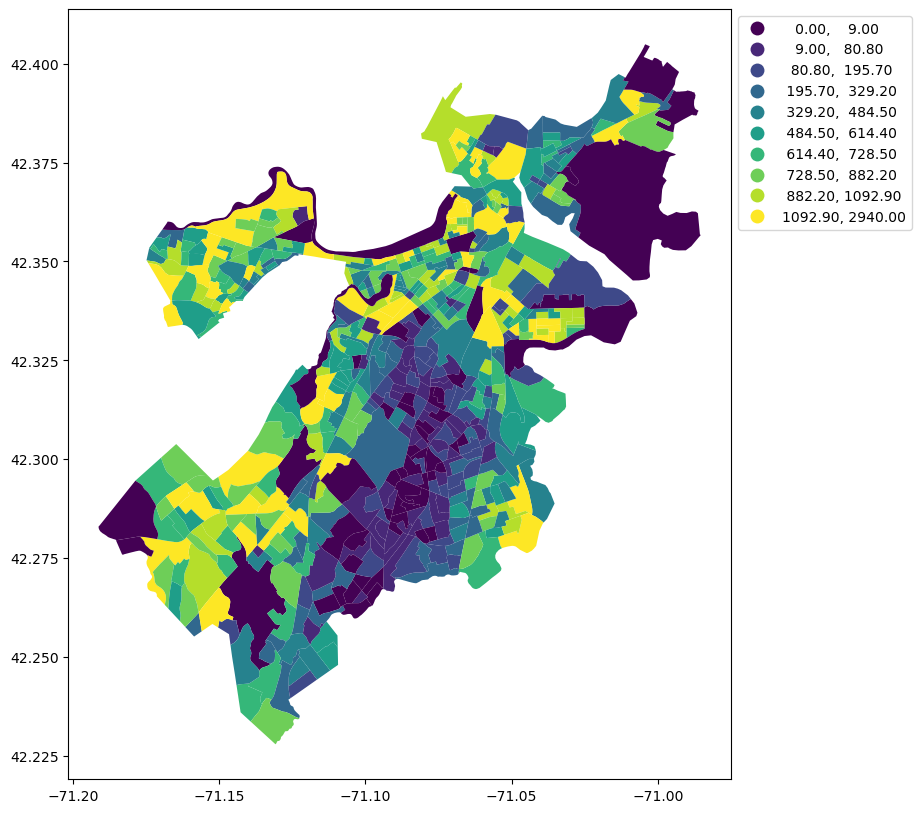

In [11]:
acs5_blockgroup_BOS.plot(column = 'White, not hispanic', k=10, scheme='Quantiles',legend=True, figsize = (10,10)
             ,legend_kwds={'bbox_to_anchor': (1, 1),'loc': 'upper left'})

# Racial Dot Maps

In [12]:
seed = 10
s = np.random.RandomState(seed) if seed else np.random.RandomState(seed)
from random import uniform

def gen_random_points_poly(poly, num_points):
    
    """
    Parameters
    ----------
    poly: 
        polygon geometry series of size N
    num_points: 
        series of size N consisting of integers representing the number of points, M, within each geometry
    
    Returns
    -------
    points:
        a list of M randomly generated point geometries within each input polygon geometry
    """

    min_x, min_y, max_x, max_y = poly.bounds
    points = []
    i=0
    while len(points) < num_points:
        random_point = Point([uniform(min_x, max_x), uniform(min_y, max_y)])
        if random_point.within(poly):
            points.append(random_point)
            i+=1
    return points

def gen_points_in_gdf_polys(geometry, values, points_per_value = None):
    """
    Take a GeoSeries of Polygons along with a Series of values and returns randomly generated points within
    these polygons. Optionally takes a "points_per_value" integer which indicates the number of points that
    should be generated for each 1 value.
    
    Parameters
    ----------
    geometry: 
        polygon geometry series of size N
    values: 
        series of size N consisting of integers representing the number of points, M, within each geometry
    points_per_value:
        number of people each point value should represent
    
    Returns
    -------
    b:
        geoseries of random generated point geometries within given geometry polygons corresponding to the number of 
        people in each given race group
    """
    
    if points_per_value:
        new_values = round(values/points_per_value).astype(int)
    else:
        new_values = values

    new_values = new_values[new_values>0]

    if(new_values.size > 0):
         
        g = gpd.GeoDataFrame(data = {'vals':new_values}, geometry = geometry)

        a = g.apply(lambda row: tuple(gen_random_points_poly(row['geometry'], row['vals'])),1)
        b = gpd.GeoSeries(a.apply(pd.Series).stack(), crs = geometry.crs)
        b.name='geometry'
        
    else:
        g = gpd.GeoDataFrame(data = {'vals':new_values*0}, geometry = geometry)

        a = g.apply(lambda row: tuple(gen_random_points_poly(row['geometry'], row['vals'])),1)
        b = gpd.GeoSeries(a.apply(pd.Series).stack(), crs = geometry.crs)
        b.name='geometry'
    
    return b

In [13]:
s = acs5_blockgroup_BOS[column_vals].sum().sort_values(ascending=False)
race_ordered_ls = s.index[1:].to_list()
print(race_ordered_ls)

['White, not hispanic', 'Black or African American, not hispanic', 'Hispanic or Latino', 'Asain, not hispanic', 'Two or More Races, not hispanic', 'Some other race alone, not hispanic', 'American Indian and Alaska Native, not hispanic', 'Native Hawaiian and Other Pacific Islander, not hispanic']


2020
2019
2018
2017
2016
2015
2014
2013


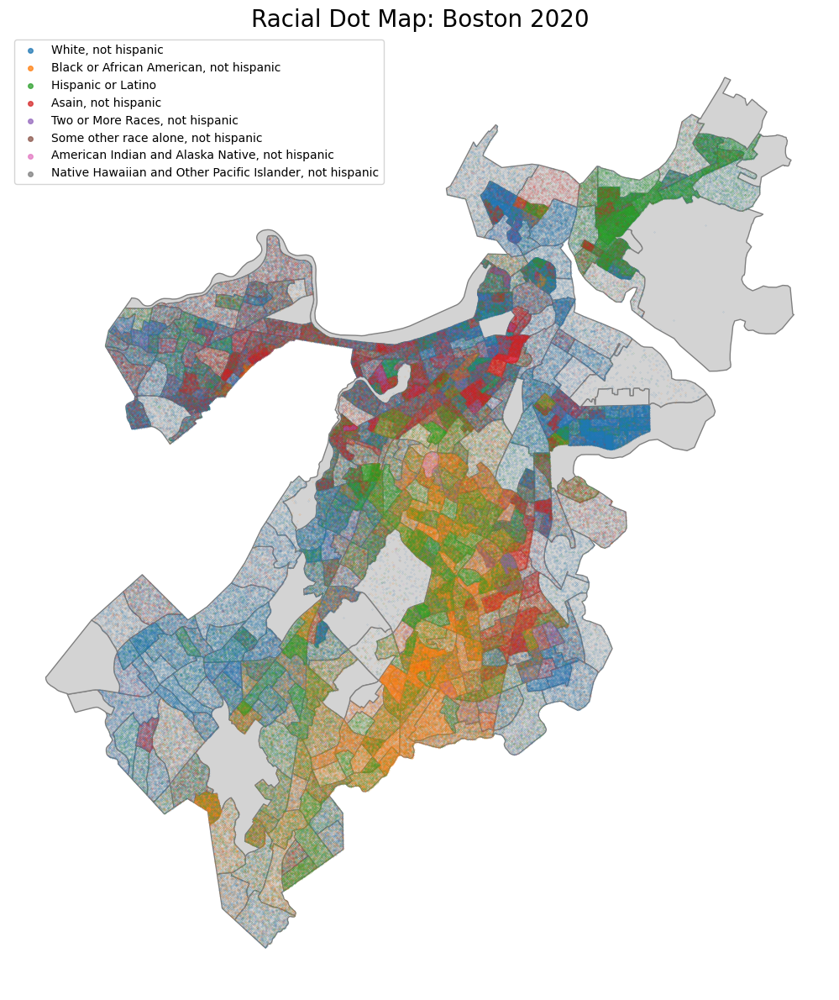

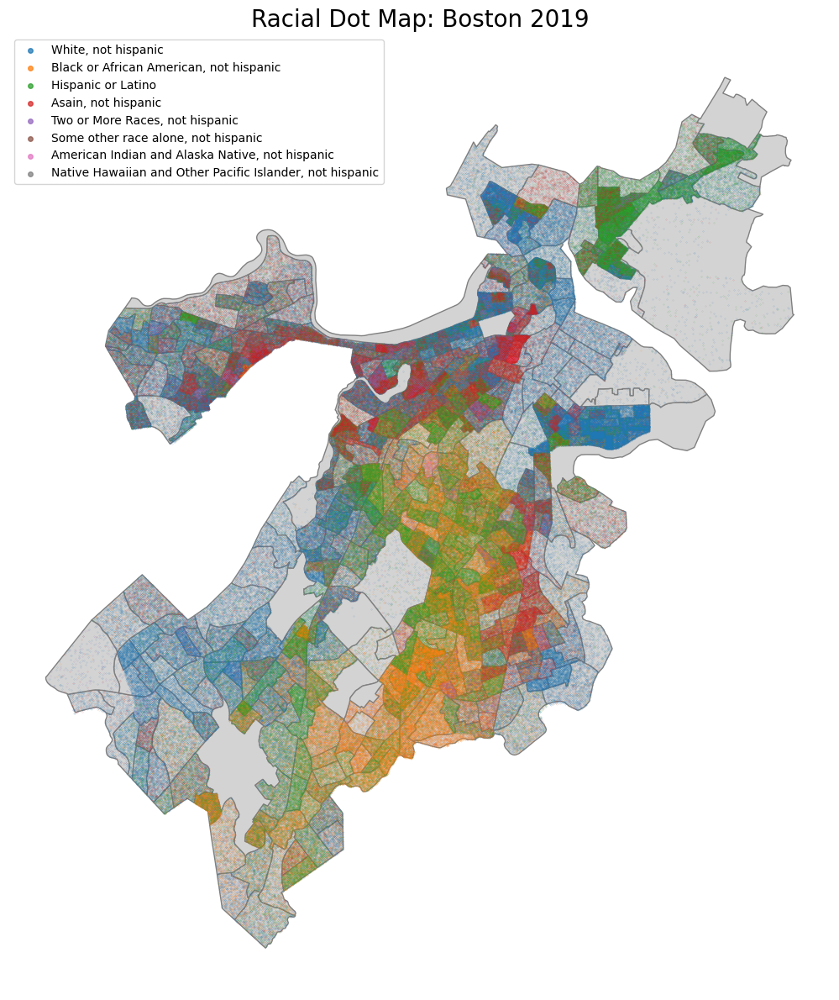

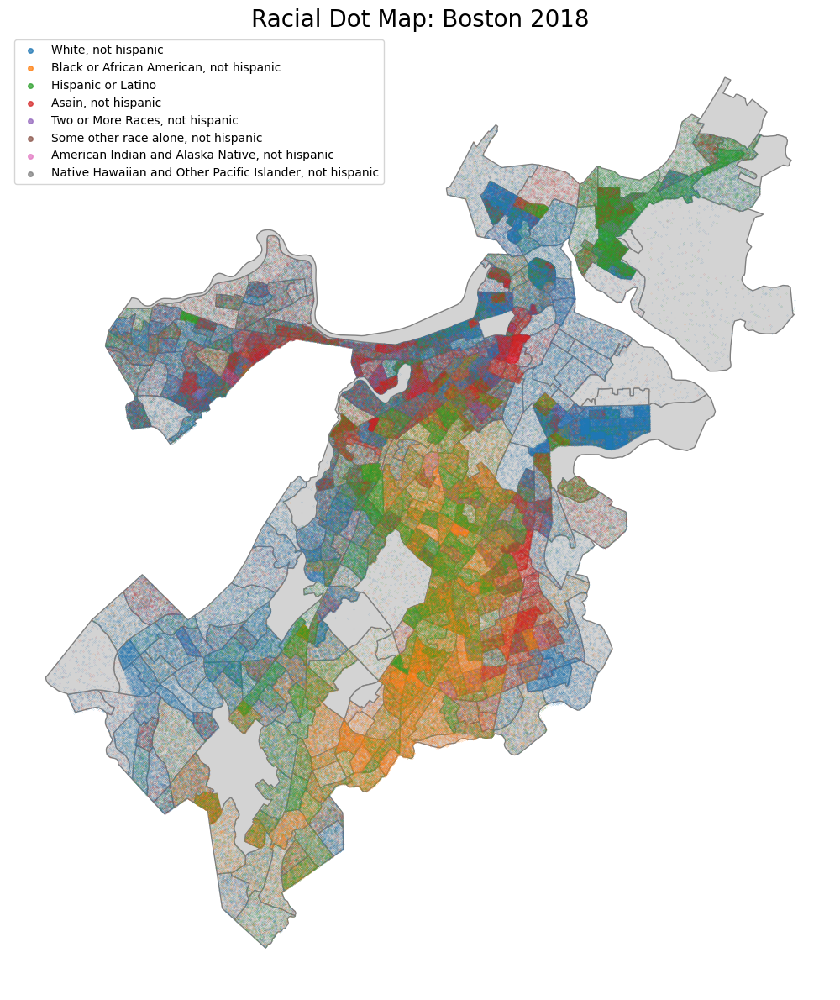

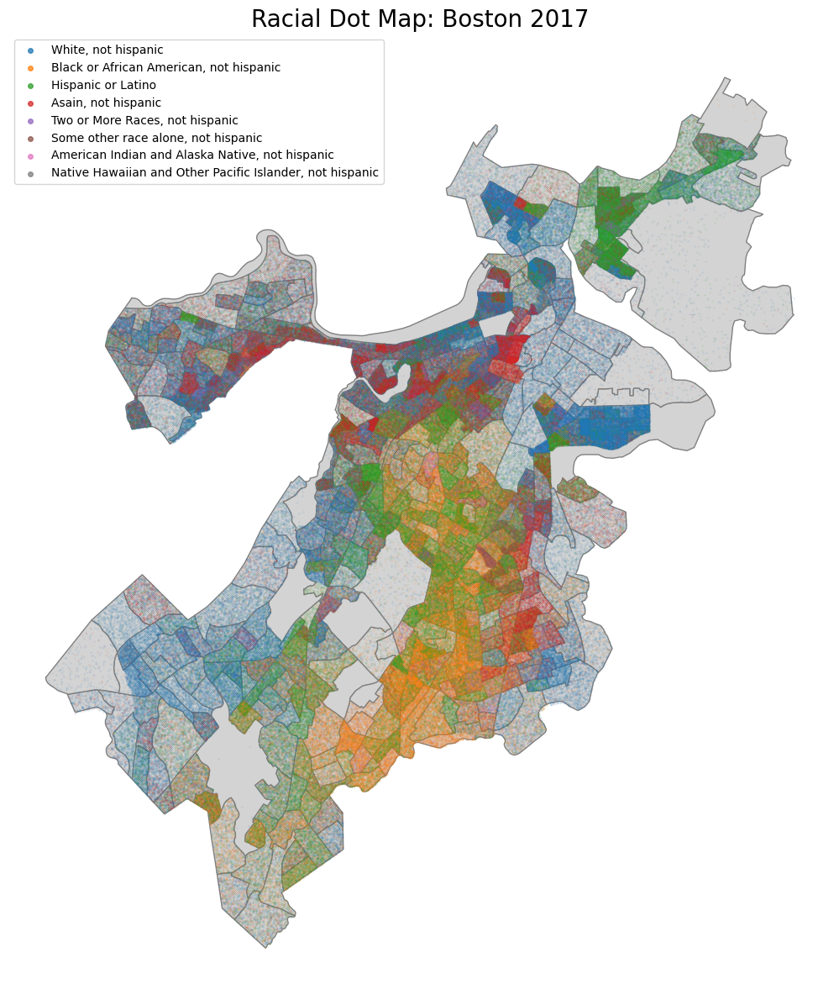

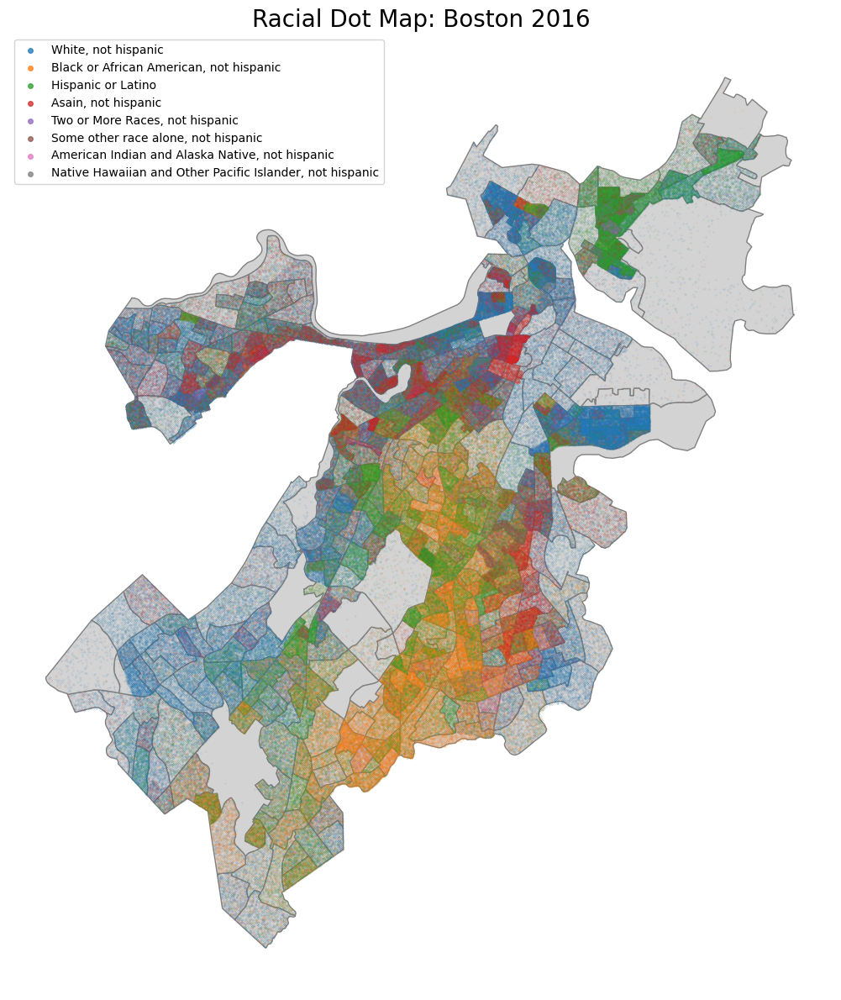

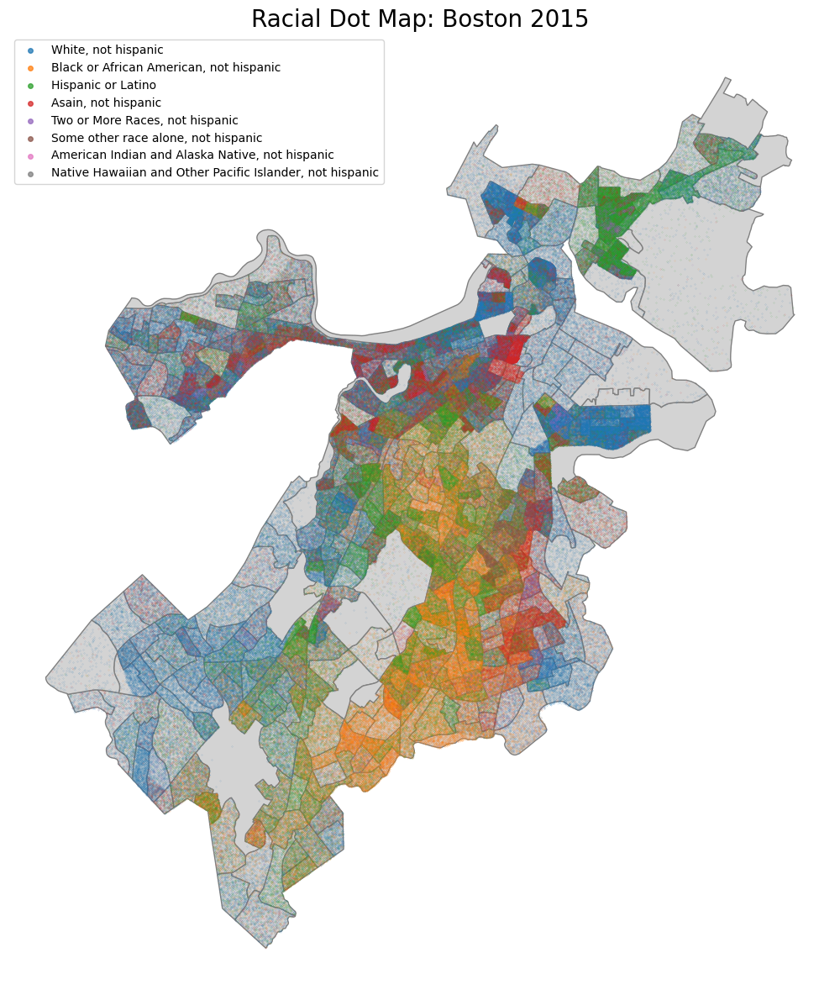

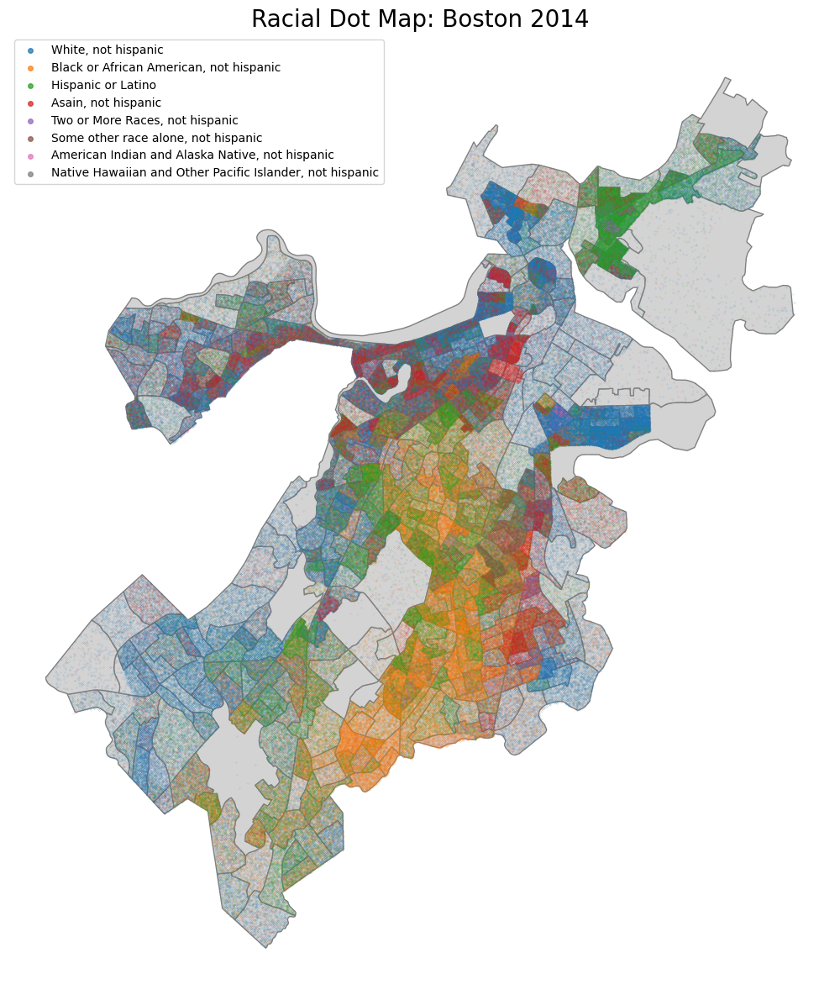

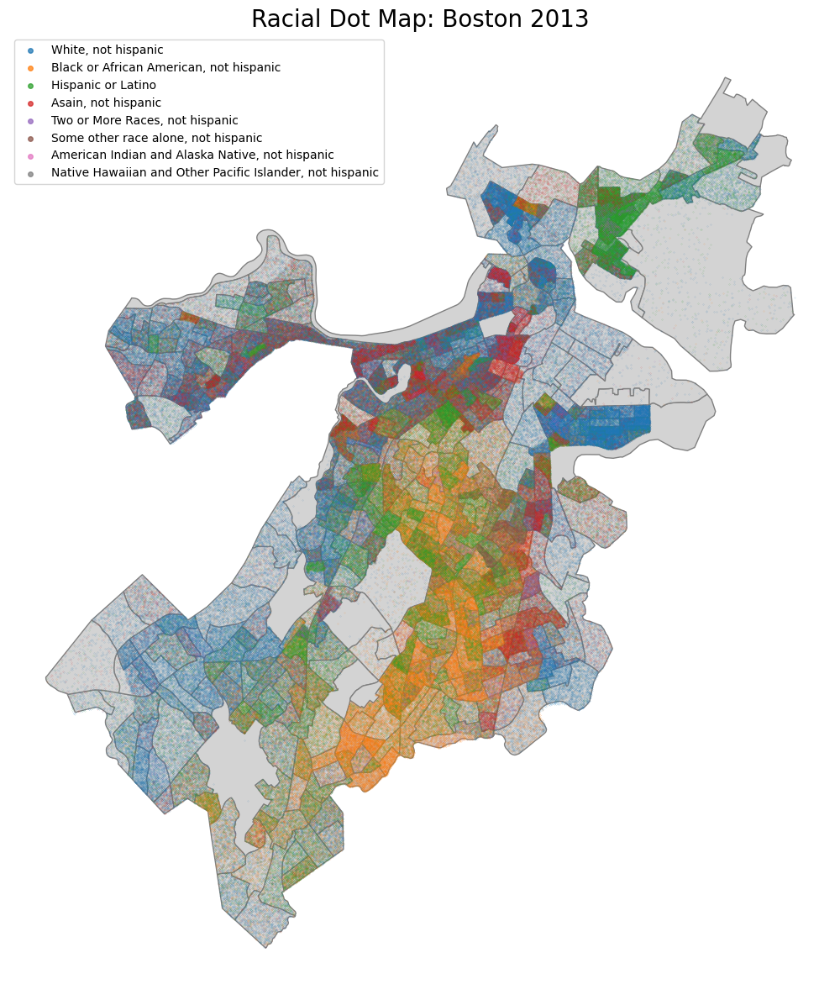

In [14]:
acs_yrls = [2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013]

for yr in acs_yrls:
    #get ACS Data
    print(yr)
    bos_ethnicity = get_acs5_data(yr,'25','025',census_columns,col_dict)
    
    #join to census block shape file
    if yr == 2020:   
        acs5_blockgroup_BOS = blockgroup20_BOS.merge(bos_ethnicity, how = 'left', left_on = ['TRACTCE20','NAMELSAD20'], right_on = ['Tract','Block Group'])
        
    else:
        acs5_blockgroup_BOS = blockgroup10_BOS.merge(bos_ethnicity, how = 'left', left_on = ['TRACT','BLKGRP'], right_on = ['Tract','Block Group'])

    #get order of races from most to least populated
    s = acs5_blockgroup_BOS[column_vals].sum().sort_values(ascending=False)
    race_ordered_ls = s.index[1:].to_list()
    
    #create dot map
    df = pd.DataFrame()

    fig, ax = plt.subplots(figsize=(12,12))

    blockgroup20_BOS.plot(ax=ax, color = 'lightgrey', edgecolor='grey')
    for race in race_ordered_ls:
        #print(race)
        df[race] = gen_points_in_gdf_polys(acs5_blockgroup_BOS['geometry'],acs5_blockgroup_BOS[race]) 
        gen_points_in_gdf_polys(acs5_blockgroup_BOS['geometry'],acs5_blockgroup_BOS[race]).plot(ax=ax, markersize = 0.01,alpha = 0.75, label = race)
        #ax.legend(race)
    ax.set_title(f'Racial Dot Map: Boston {yr}', fontsize=20)
    ax.legend(markerscale = 40)
    fig.patch.set_visible(False)
    ax.axis('off')
    plt.tight_layout()
    fig.savefig(f'../Outputs/{yr}BostonDotMap.png',bbox_inches = 'tight')

In [15]:
acs_yrls = [2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013]
acs_yrls.reverse()
print(acs_yrls)

[2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]


MovieWriter ffmpeg unavailable; using Pillow instead.


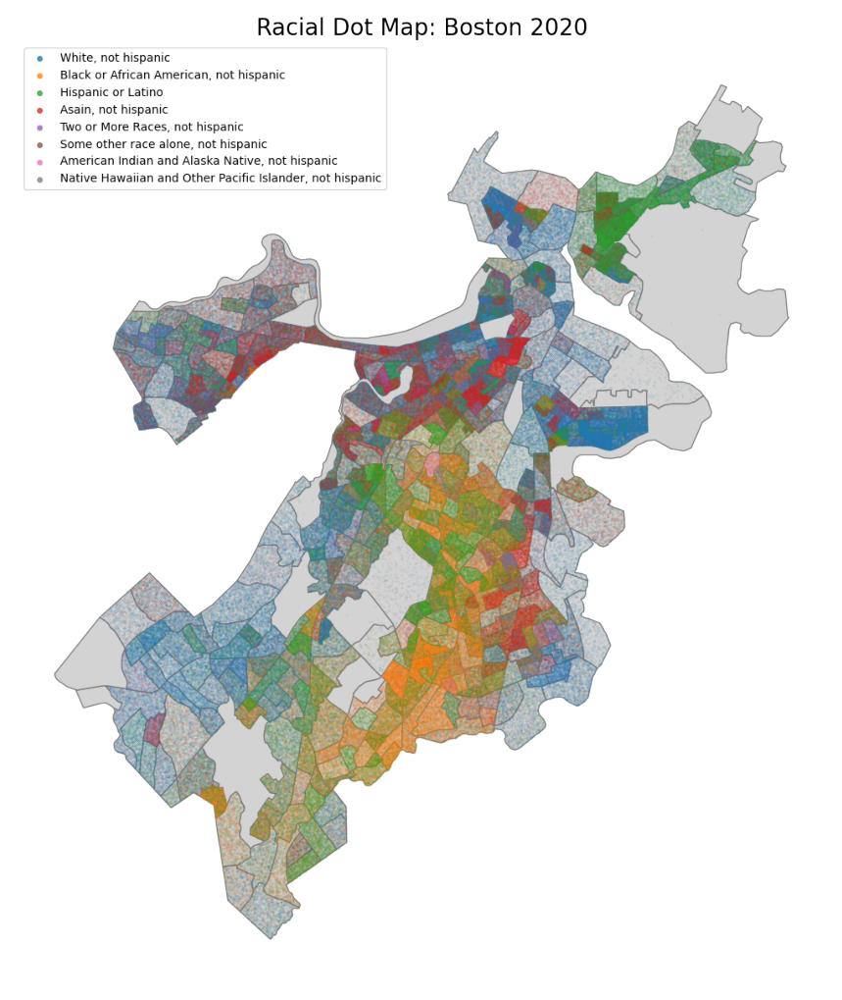

In [16]:
#make gif
import matplotlib.animation as animation

# Create new figure for GIF
fig, ax = plt.subplots(figsize = (10,10))

# Adjust figure so GIF does not have extra whitespace
fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=None, hspace=None)
ax.axis('off')
ims = []

acs_yrls = [2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013]
acs_yrls.reverse()

for yr in acs_yrls:
    im = ax.imshow(plt.imread(f'../Outputs/{yr}BostonDotMap.png'), animated = True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=1000)
ani.save('../Outputs/BOS_racialdotmap13_20.gif')

# Contingency Table & Shannon Diversity Index

In [17]:
geo_col_name = [col for col in acs5_blockgroup_BOS.columns.to_list() if col.find('GEOID') == 0][0]
print(geo_col_name)

GEOID10


In [18]:
def get_diversity_index(df, race_cols):
    
    geo_col_name = [col for col in df.columns.to_list() if col.find('GEOID') == 0][0]
    cont_tbl = df[[geo_col_name]+race_cols]
    cont_tbl.set_index(geo_col_name, inplace = True)
    
    cont_tbl['Total in Block Group'] = cont_tbl.sum(axis = 'columns')
    #drop any rows with zero total population in block group
    cont_tbl = cont_tbl[cont_tbl['Total in Block Group'] > 25]
    #compute city averages
    tot_race = cont_tbl.sum(axis = 'index')
    perc_race = tot_race / tot_race.sum()
    H_x_avg = -((perc_race*np.log(perc_race)).sum())
    
    
    cols = cont_tbl.columns.to_list()
    H_x = []
    evenness = []

    for index, row in cont_tbl.iterrows():
        perc_race = np.array(row[cols[:-1]])/row[cols[-1]]
        H = -(np.nansum(perc_race*np.log(perc_race)))
        even = H/np.log(len(cols[:-1]))
        H_x.append(H)
        evenness.append(even)

    cont_tbl['H_x'] = H_x
    cont_tbl['Evenness'] = evenness
    
    return H_x_avg, cont_tbl[['Total in Block Group','H_x','Evenness']]


2020
2019
2018
2017
2016
2015
2014
2013


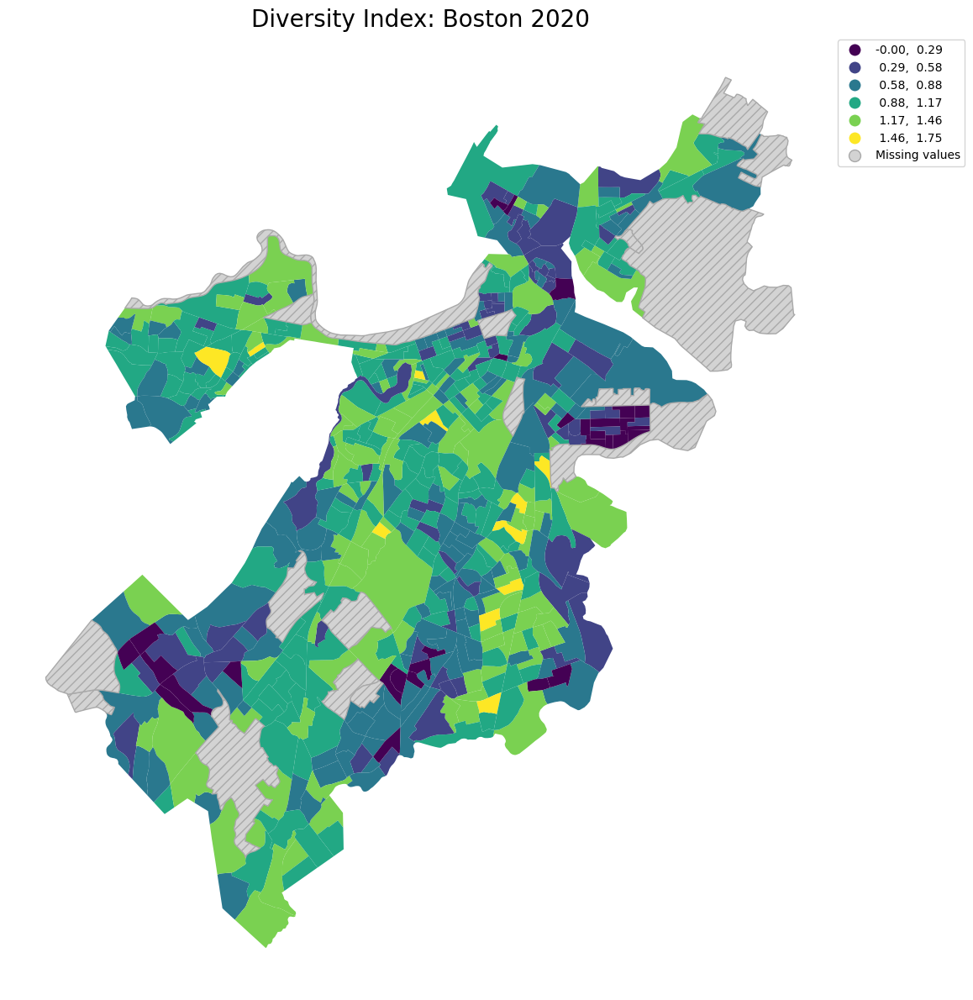

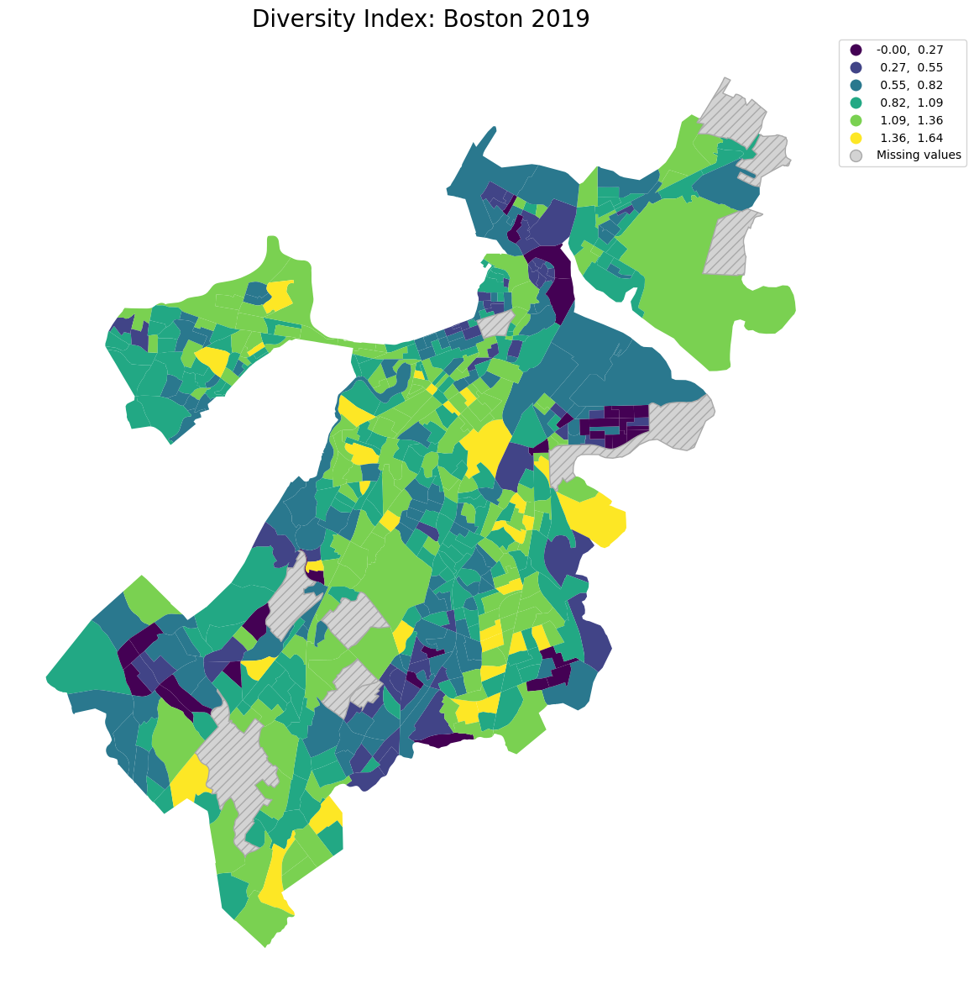

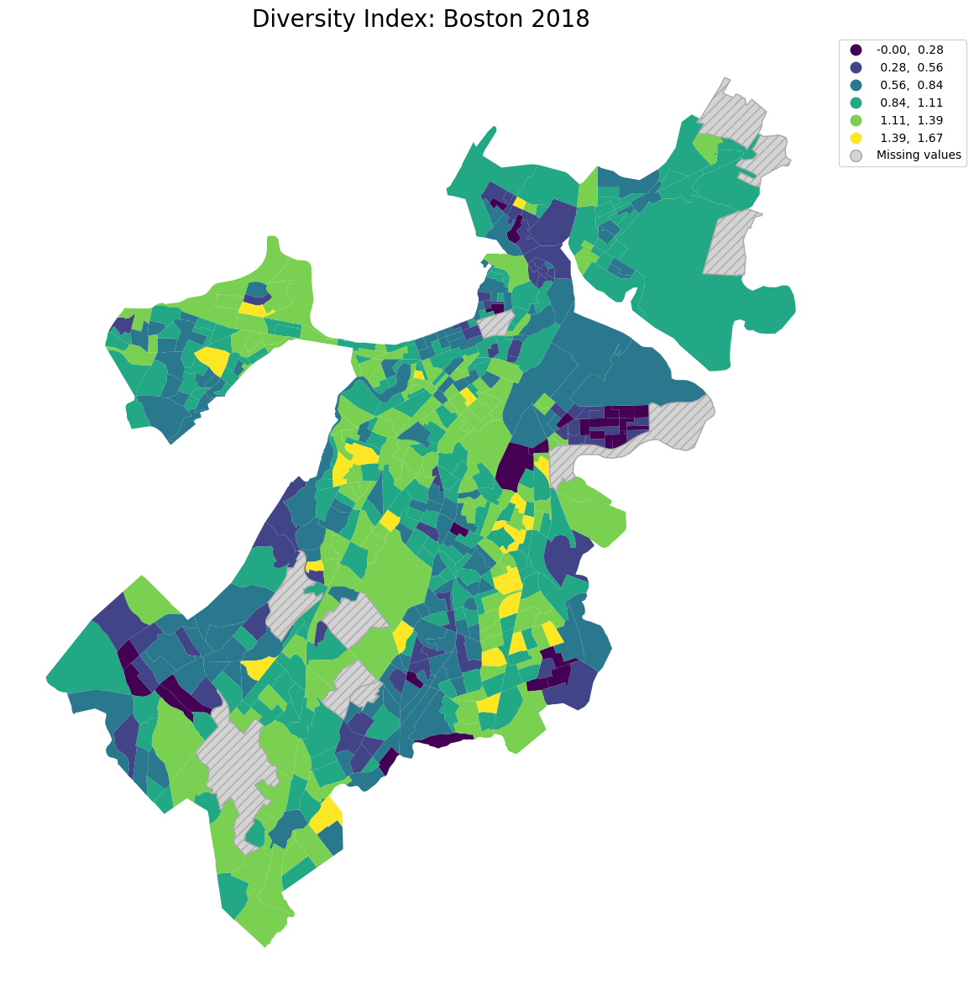

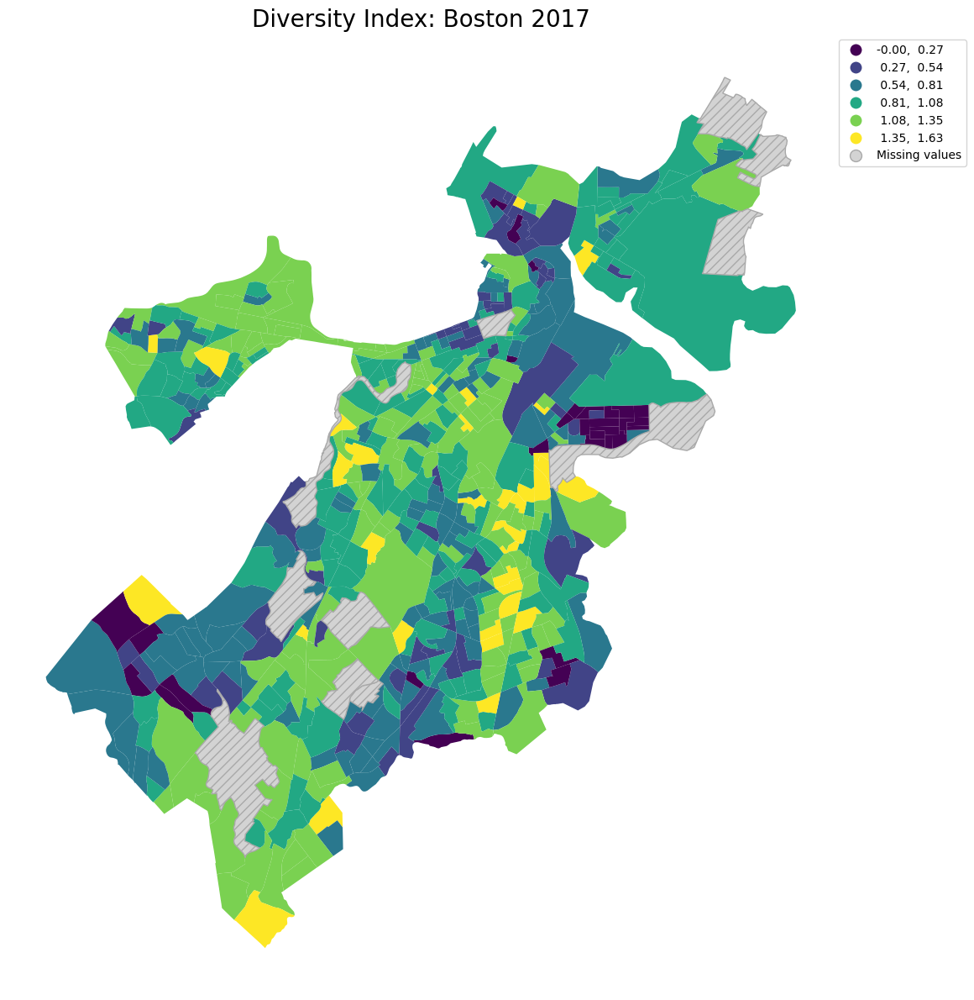

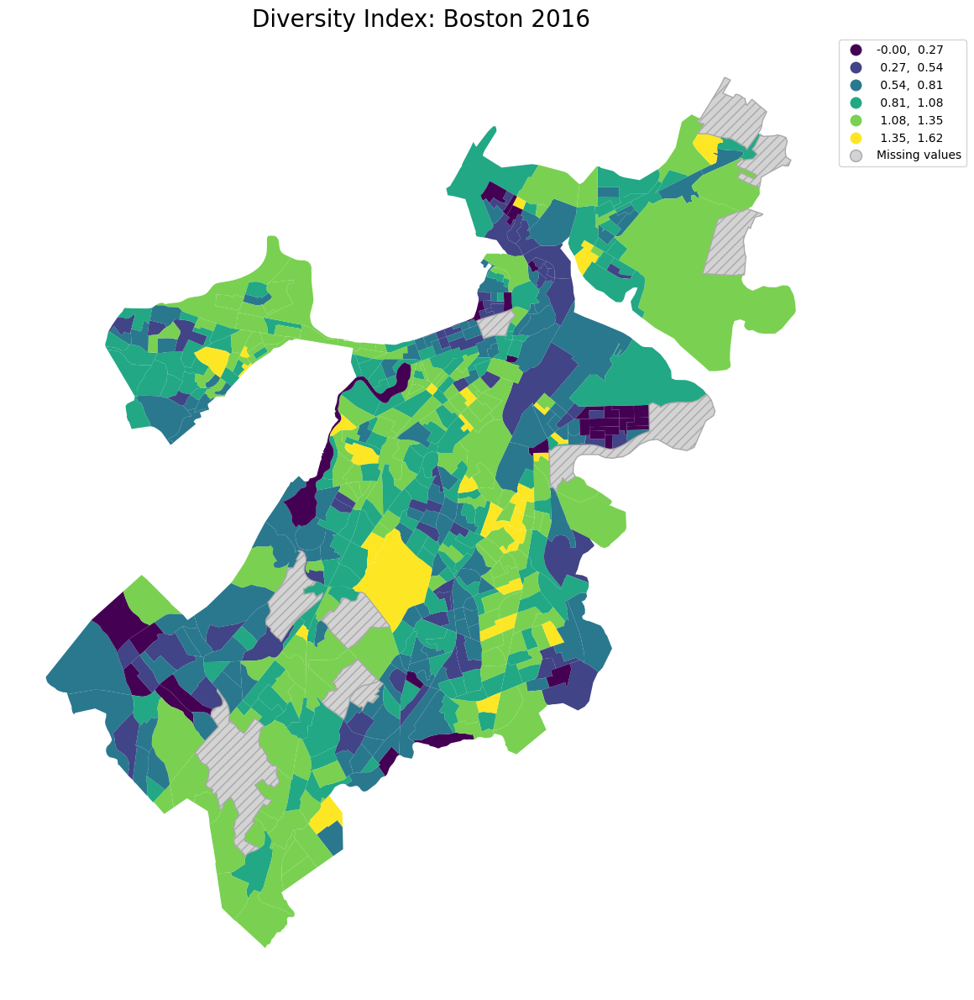

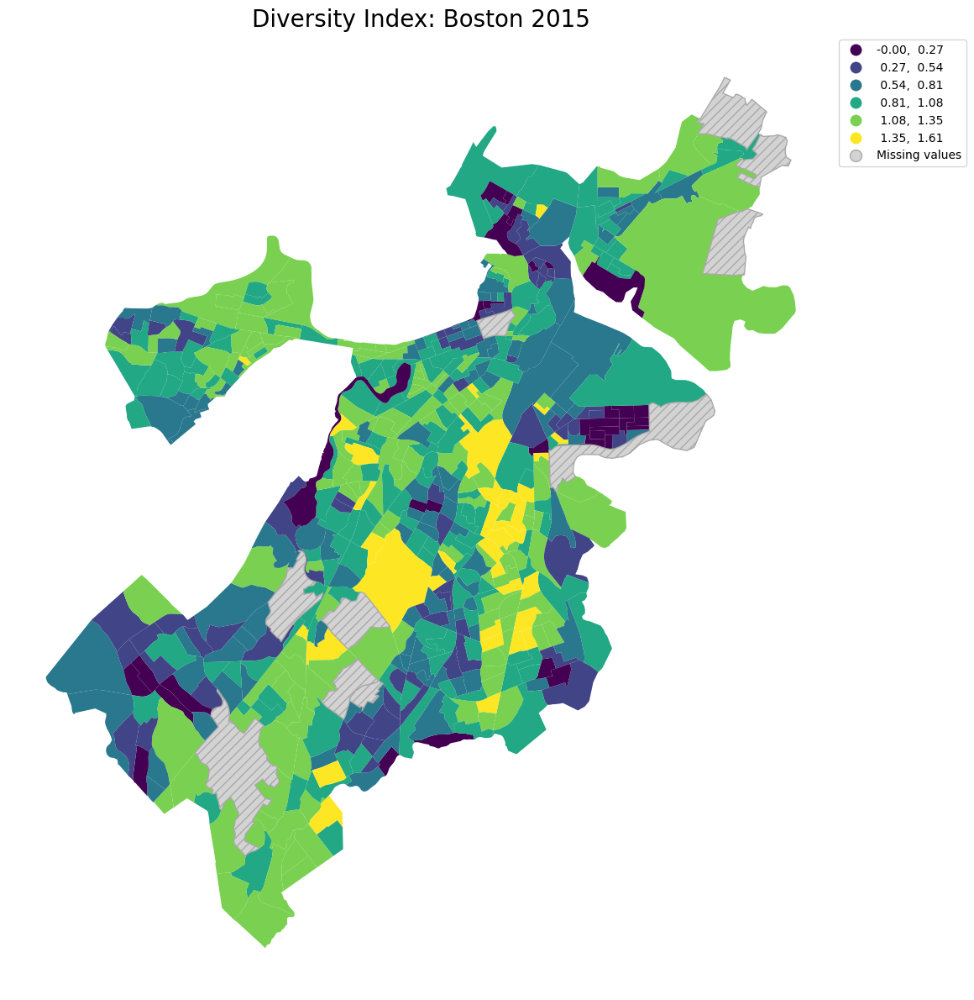

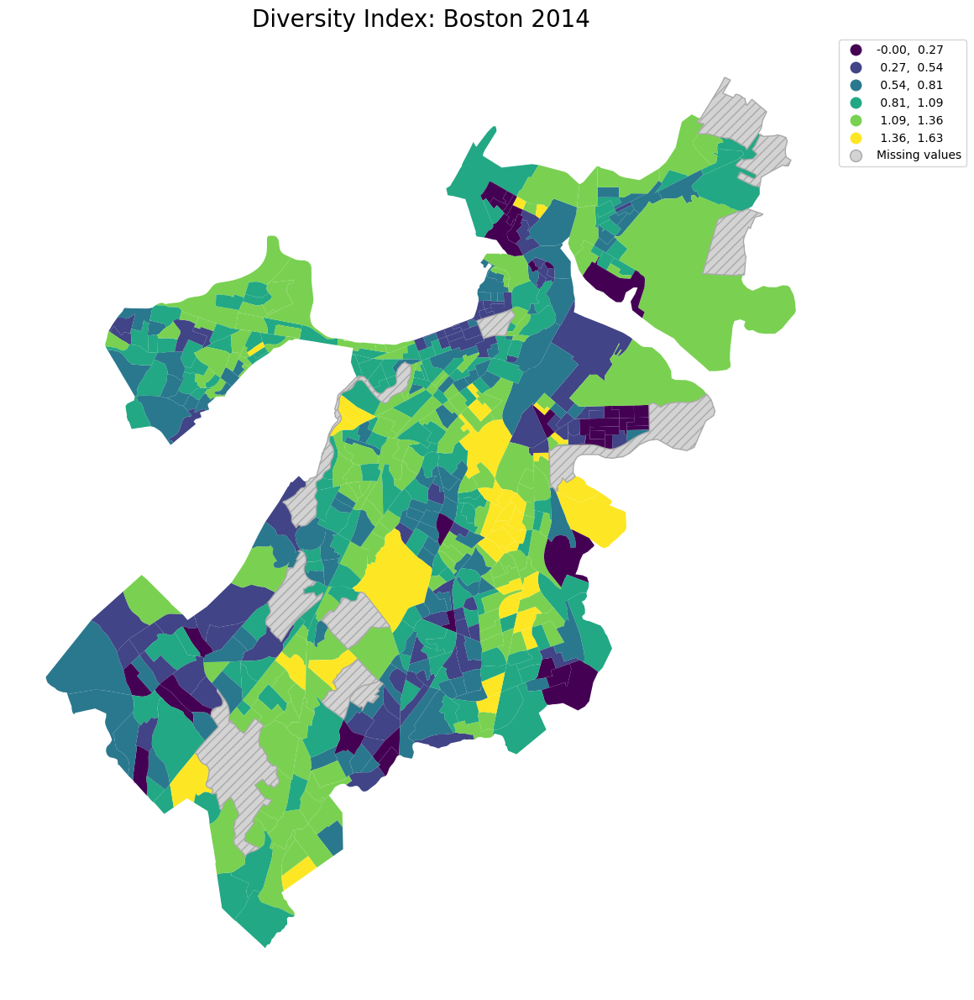

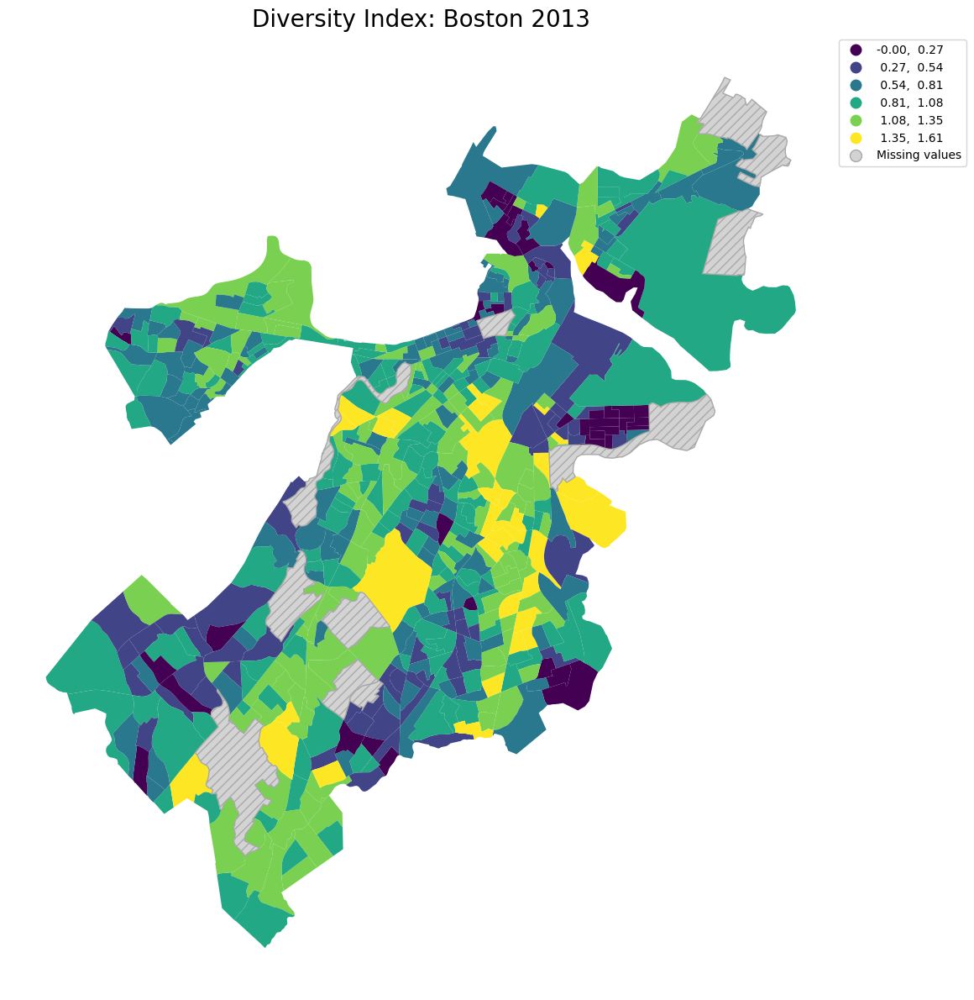

In [19]:
acs_yrls = [2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013]

for yr in acs_yrls:
    #get ACS Data
    print(yr)
    bos_ethnicity = get_acs5_data(yr,'25','025',census_columns,col_dict)
    
    #join to census block shape file
    if yr == 2020:   
        acs5_blockgroup_BOS = blockgroup20_BOS.merge(bos_ethnicity, how = 'left',\
                                                     left_on = ['TRACTCE20','NAMELSAD20'],\
                                                     right_on = ['Tract','Block Group'])
        Hx, DI_df = get_diversity_index(acs5_blockgroup_BOS,column_vals[1:])
        blockgroup_DI = blockgroup20_BOS.merge(DI_df, how = 'left', on = 'GEOID20')
    
    else:
        acs5_blockgroup_BOS = blockgroup10_BOS.merge(bos_ethnicity, how = 'left',\
                                                     left_on = ['TRACT','BLKGRP'],\
                                                     right_on = ['Tract','Block Group'])
        Hx, DI_df = get_diversity_index(acs5_blockgroup_BOS,column_vals[1:])
        blockgroup_DI = blockgroup10_BOS.merge(DI_df, how = 'left', on = 'GEOID10')
        
    
    fig, ax = plt.subplots(figsize=(12,12))

    blockgroup_DI.plot(column = 'H_x',ax=ax, k=6, scheme='EqualInterval',
                            markersize=0.01,figsize=(10,10),legend = True, 
                            missing_kwds={"color": "lightgrey", ## what to do with missing values
                                             "edgecolor": "darkgrey",
                                            "hatch": "///",
                                            "label": "Missing values",}
                           ,legend_kwds={'bbox_to_anchor': (1, 1),'loc': 'upper left'})
    ax.set_title(f'Diversity Index: Boston {yr}', fontsize=20)
#     #ax.legend(markerscale = 40)
    fig.patch.set_visible(False)
    ax.axis('off')
    plt.tight_layout()
    #plt.title(f'Diversity Index: Boston {yr}', fontsize=20)
    fig.savefig(f'../Outputs/{yr}BostonDiversityIndex.png',bbox_inches = 'tight')

MovieWriter ffmpeg unavailable; using Pillow instead.


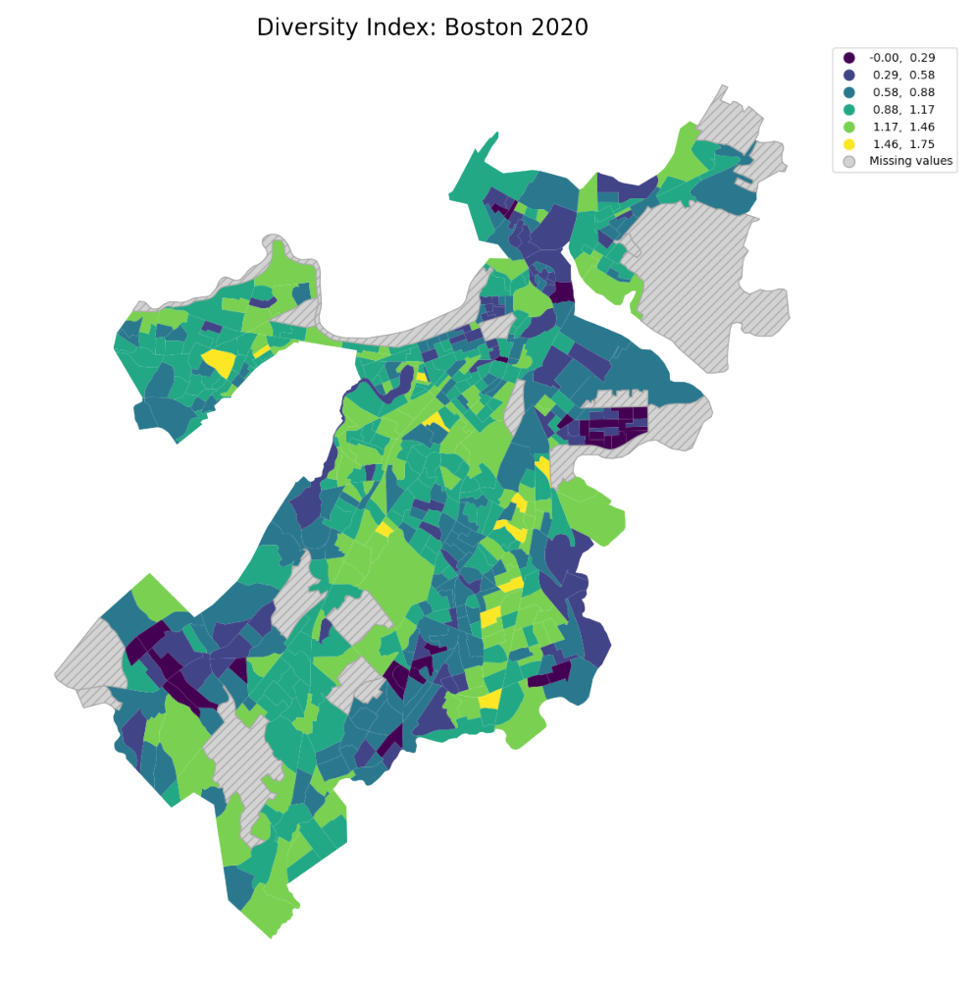

In [20]:
#make gif
import matplotlib.animation as animation

# Create new figure for GIF
fig, ax = plt.subplots(figsize = (10,10))

# Adjust figure so GIF does not have extra whitespace
fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=None, hspace=None)
ax.axis('off')
ims = []

acs_yrls = [2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013]
acs_yrls.reverse()

for yr in acs_yrls:
    im = ax.imshow(plt.imread(f'../Outputs/{yr}BostonDiversityIndex.png'), animated = True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=1000)
ani.save('../Outputs/BOS_DiversityIndexmap13_20.gif')

# Get % Difference from 2013 to 2020 

In [21]:
#2020
bos_ethnicity = get_acs5_data(2020,'25','025',census_columns,col_dict)
acs5_blockgroup_BOS = blockgroup20_BOS.merge(bos_ethnicity, how = 'left',\
                                                     left_on = ['TRACTCE20','NAMELSAD20'],\
                                                     right_on = ['Tract','Block Group'])
Hx_20, DI_df20 = get_diversity_index(acs5_blockgroup_BOS,column_vals[1:])
DI_df20.reset_index(inplace = True)
acs5_blockgroup_BOS_20 = acs5_blockgroup_BOS.merge(DI_df20, how = 'left', on = 'GEOID20')
acs5_blockgroup_BOS_20.head()

,OBJECTID,STATEFP20,COUNTYFP20,TRACTCE20,BLKGRPCE20,GEOID20,NAMELSAD20,MTFCC20,FUNCSTAT20,ALAND20,...,"Asain, not hispanic","Native Hawaiian and Other Pacific Islander, not hispanic","Some other race alone, not hispanic","Two or More Races, not hispanic",Hispanic or Latino,Block Group,Tract,Total in Block Group,H_x,Evenness
0,1,25,025,040600,1,250250406001,Block Group 1,G5030,S,1265377.0,...,102,0,0,25,101,Block Group 1,040600,1479.0,0.908151,0.436728
1,2,25,025,051101,1,250250511011,Block Group 1,G5030,S,220626.0,...,82,0,0,0,1191,Block Group 1,051101,2391.0,1.011732,0.486540
2,3,25,025,051101,4,250250511014,Block Group 4,G5030,S,227071.0,...,18,0,0,0,649,Block Group 4,051101,1019.0,0.816840,0.392817
3,4,25,025,981600,1,250259816001,Block Group 1,G5030,S,586981.0,...,0,0,0,0,0,Block Group 1,981600,NaN,NaN,NaN
4,5,25,025,010204,3,250250102043,Block Group 3,G5030,S,145888.0,...,201,0,0,15,56,Block Group 3,010204,771.0,1.060207,0.509852


In [37]:
#2020 BG DI avg
DI_df20['H_x'].mean()

0.9058054288161095

In [22]:
#2013
bos_ethnicity = get_acs5_data(2013,'25','025',census_columns,col_dict)
acs5_blockgroup_BOS = blockgroup10_BOS.merge(bos_ethnicity, how = 'left',\
                                                     left_on = ['TRACT','BLKGRP'],\
                                                     right_on = ['Tract','Block Group'])
Hx_10, DI_df10 = get_diversity_index(acs5_blockgroup_BOS,column_vals[1:])
DI_df10.reset_index(inplace = True)
acs5_blockgroup_BOS_10 = acs5_blockgroup_BOS.merge(DI_df10, how = 'left', on = 'GEOID10')
acs5_blockgroup_BOS_10.head()

,OBJECTID,GEOID10,ALAND10,AWATER10,POP100,HU100,Type,Res,BG_ID_10,CT_ID_10,...,"Asain, not hispanic","Native Hawaiian and Other Pacific Islander, not hispanic","Some other race alone, not hispanic","Two or More Races, not hispanic",Hispanic or Latino,Block Group,Tract,Total in Block Group,H_x,Evenness
0,1,250250101031,101211.0,0.0,2111.0,309.0,I,0.0,250250101031,25025010103,...,504,0,0,52,96,Block Group 1,010103,1701.0,0.968519,0.465759
1,2,250250104053,39125.0,0.0,626.0,355.0,I,0.0,250250104053,25025010405,...,160,0,0,6,128,Block Group 3,010405,685.0,1.339211,0.644024
2,3,250250102033,67710.0,0.0,1563.0,1078.0,I,0.0,250250102033,25025010203,...,154,0,7,0,251,Block Group 3,010203,1663.0,1.009727,0.485576
3,4,250250102032,115062.0,0.0,2369.0,1526.0,I,0.0,250250102032,25025010203,...,247,0,0,29,190,Block Group 2,010203,1899.0,0.813412,0.391168
4,5,250250102041,39843.0,0.0,1098.0,287.0,I,0.0,250250102041,25025010204,...,237,0,13,12,82,Block Group 1,010204,1055.0,1.058888,0.509217


In [38]:
#2013 BG avg DI
DI_df10['H_x'].mean()

0.8577879554726101

In [23]:
acs5_blockgroup_BOS_10 = acs5_blockgroup_BOS_10.to_crs('EPSG:4326')

In [24]:
acs5_blockgroup_BOS_20.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [25]:
acs5_blockgroup_BOS_10.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [26]:
#rasterize to get perc change
from geocube.api.core import make_geocube

cube20 = make_geocube(
    acs5_blockgroup_BOS_20,
    measurements=["H_x"],
    resolution=(.0001, -.0001),
)

cube20.H_x.rio.to_raster("../Outputs/H_x_2020BOS.tif")

cube10 = make_geocube(
    acs5_blockgroup_BOS_10,
    measurements=["H_x"],
    resolution=(.0001, -.0001),
)

cube10.H_x.rio.to_raster("../Outputs/H_x_2013BOS.tif")

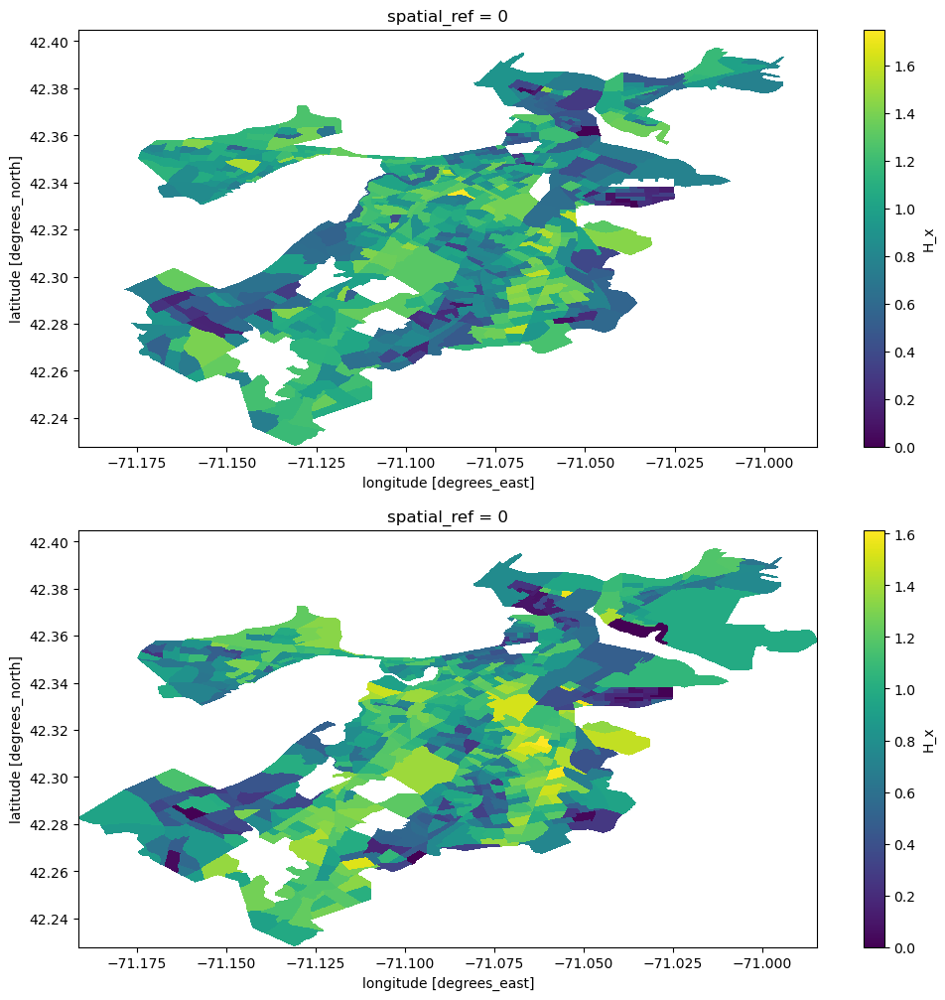

In [27]:
fix, ax = plt.subplots(2,1, figsize = (12,12))
cube20.H_x.plot(ax = ax[0])
cube10.H_x.plot(ax = ax[1])

In [28]:
import os
import rasterio
from osgeo import gdal, osr
from matplotlib.colors import ListedColormap, BoundaryNorm
import numpy as np
import xarray as xr
import rioxarray as rxr

BOS2020 = rxr.open_rasterio("../Outputs/H_x_2020BOS.tif", masked=True).squeeze()
BOS2013 = rxr.open_rasterio("../Outputs/H_x_2013BOS.tif", masked=True).squeeze()
# Create canopy height model (CHM)
BOS_chng = (BOS2020 - BOS2013) / BOS2013 * 100
BOS_chng = BOS_chng.where(BOS_chng != np.inf)

In [36]:
BOS_chng

<xarray.DataArray (y: 1356, x: 415)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * x            (x) float64 -70.99 -70.99 -70.99 ... -71.19 -71.19 -71.19
  * y            (y) float64 42.23 42.23 42.23 42.23 ... 42.4 42.4 42.4 42.4
    band         int64 1
    spatial_ref  int64 0

In [29]:
BOS_chng.rio.to_raster("../Outputs/H_x_BOS_PercChange.tif")

In [30]:
print('min Change:', np.nanmin(BOS_chng))
print('max Change:', np.nanmax(BOS_chng))

min Change: -100.0
max Change: 1831.8796106681677


In [31]:
meandata = np.nanmean(BOS_chng)
mediandata = np.nanmedian(BOS_chng)
print('Mean Percent Change from 2013 to 2020: '+str(meandata))
print('Median Percent Change from 2013 to 2020: '+str(mediandata))

Mean Percent Change from 2013 to 2020: 20.57599585484785
Median Percent Change from 2013 to 2020: 1.4407457149652654


Due to large positive outliers, stemming from geographics with an initial DI of zero in 2013 and a positive non-zero DI in 2020, using the mean percent change is not the most accurate metric to determine changes in diversity. Looking at the median value shows us that 50% of values in our raster have a percent change below/above +1.75%. This indicates a positive trend towards more diverse census block groups in Boston

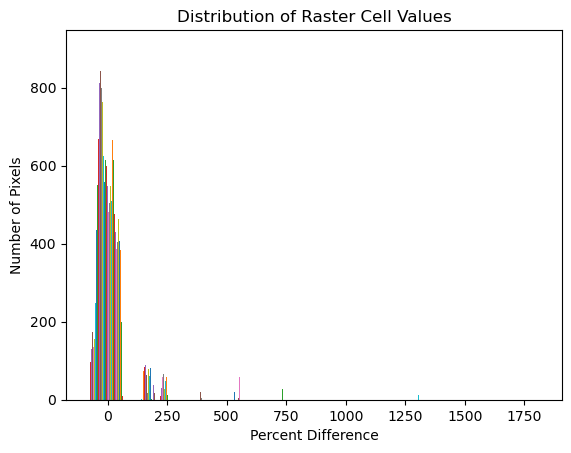

In [32]:
#view distribution of pixel values to see outliers
f, ax = plt.subplots()
plt.hist(BOS_chng)
ax.set(title="Distribution of Raster Cell Values",
       xlabel="Percent Difference",
       ylabel="Number of Pixels")
plt.show()

In [33]:
raster_chng = gdal.Open("../Outputs/H_x_BOS_PercChange.tif")
data = raster_chng.ReadAsArray().astype('float')

In [34]:
#save scaled perc shape to .tif
dst_filename = "../Outputs/H_x_BOS_PercChange.tif"
# #flip data_norm
data = np.flipud(BOS_chng)
data = np.fliplr(data)

#Saving raster
ulx, xres, xskew, uly, yskew, yres  = raster_chng.GetGeoTransform()
lrx = ulx + (raster_chng.RasterXSize * xres)
lry = uly + (raster_chng.RasterYSize * yres)
geotransform=(lrx,-xres,0,lry,0, -yres)

output_raster = gdal.GetDriverByName('GTiff').Create(dst_filename,raster_chng.RasterXSize, raster_chng.RasterYSize, 1 ,gdal.GDT_Float32)  # Open the file
output_raster.SetGeoTransform(geotransform)  # Specify its coordinates
srs = osr.SpatialReference()                 # Establish its coordinate encoding
srs.ImportFromEPSG(4326)                     # This one specifies WGS84 lat long.
output_raster.SetProjection(srs.ExportToWkt())   # Exports the coordinate system to the file
output_raster.GetRasterBand(1).WriteArray(data)   # Writes my array to the raster
output_raster.FlushCache()
output_raster = None

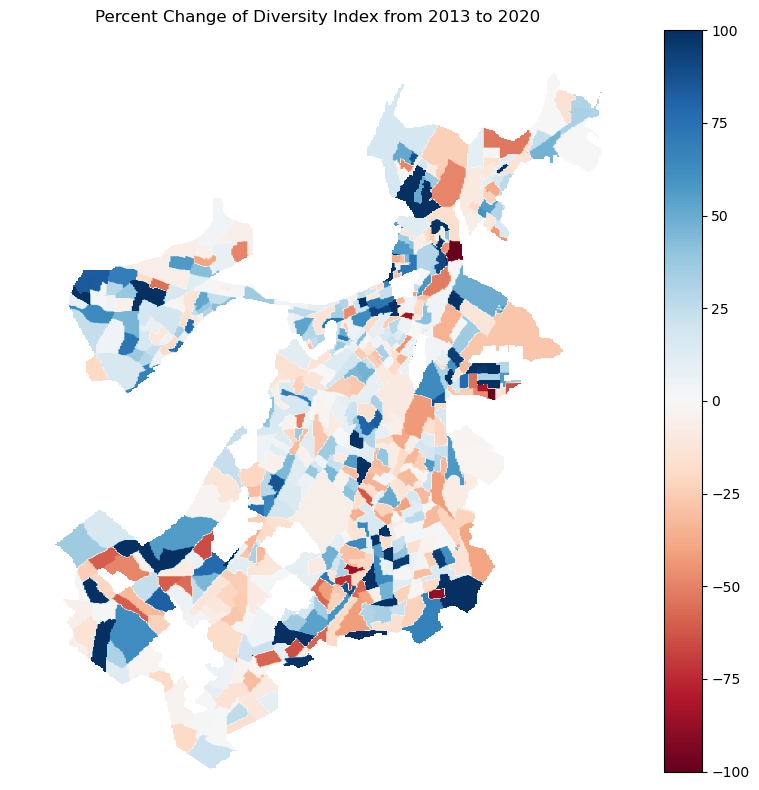

In [35]:
#visualize
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(data,aspect='auto',vmin = np.nanmin(data), vmax = -np.nanmin(data), cmap = 'RdBu')
plt.colorbar()
plt.title('Percent Change of Diversity Index from 2013 to 2020')
fig.patch.set_visible(False)
plt.axis('off')
plt.tight_layout()
fig.savefig(f'../Outputs/BostonDI_PercChange.png',bbox_inches = 'tight')